In [1]:
#importing the libraries needed

import pandas as pd
import numpy as np
import dask
import dask.dataframe as dd

# Data importing

In the next section we loaded the data in .parquet format and checked the data type of the columns and the number of rows. In 2017, there were more than 110 million rows, so we narrowed it down ith sampling (250 000 data row by months).

In [2]:
# importing data with dask
df_2017 = dd.read_parquet("/content/drive/MyDrive/BigData/yellow_taxi_2017/*.parquet", engine='pyarrow')
df_2021 = dd.read_parquet("/content/drive/MyDrive/BigData/yellow_taxi_2021/*.parquet", engine='pyarrow')

In [ ]:
# checking the data types of the columns
# there are 3 non-numerical columns
df_2021.dtypes

VendorID                          int64
tpep_pickup_datetime     datetime64[ns]
tpep_dropoff_datetime    datetime64[ns]
passenger_count                 float64
trip_distance                   float64
RatecodeID                      float64
store_and_fwd_flag               object
PULocationID                      int64
DOLocationID                      int64
payment_type                      int64
fare_amount                     float64
extra                           float64
mta_tax                         float64
tip_amount                      float64
tolls_amount                    float64
improvement_surcharge           float64
total_amount                    float64
congestion_surcharge            float64
airport_fee                     float64
dtype: object

In [3]:
# the original data set contained 113.500.327 rows
# it was too large, so we narrowed the dataset with sampling 
num_rows_2017 = len(df_2017)
df_2017 = df_2017.sample(frac=3000000/num_rows_2017, replace=None, random_state=10) #250.000 rows x 12 months
print(len(df_2017))

3000000


In [4]:
num_rows_2021 = len(df_2021)
df_2021 = df_2021.sample(frac=3000000/num_rows_2021, replace=None, random_state=10) #250.000 rows x 12 months
print(len(df_2021))

3000001


#Data cleansing and feature engineering - year 2017

In this and the next section, we have carried out the necessary data cleansing tasks. For trip_amounts, there is no significant number of outlier values. However, there were columns with significant missing values. In addition, existing features were converted to the appropriate format where necessary and new variables were created.

In [ ]:
# check the number of NAs
# assumption: maybe airport_fee and congestion_surcharge can be droped
df_2017.isnull().sum().compute().sort_values(ascending=False)

airport_fee              3000000
congestion_surcharge     3000000
fare_amount                    0
total_amount                   0
improvement_surcharge          0
tolls_amount                   0
tip_amount                     0
mta_tax                        0
extra                          0
VendorID                       0
tpep_pickup_datetime           0
DOLocationID                   0
PULocationID                   0
store_and_fwd_flag             0
RatecodeID                     0
trip_distance                  0
passenger_count                0
tpep_dropoff_datetime          0
payment_type                   0
dtype: int64

In [5]:
# fill NAs with 0
df_2017 = df_2017.fillna(0)

In [ ]:
df_2017.tip_amount.max().compute()

300.0

In [6]:
# based on our data dictionary, convert store and forward flag's yes/no label to 1/0

df_2017['store_and_fwd_flag'] = df_2017['store_and_fwd_flag'].mask(df_2017['store_and_fwd_flag'] == 'N', '0').mask(df_2017['store_and_fwd_flag'] == 'Y', '1')
df_2017['store_and_fwd_flag'] = df_2017['store_and_fwd_flag'].astype(str).astype(int)

In [7]:
# calculating and adding a new column concerning to the difference between the pickup and dropoff datetime gaining the travel time by trips

df_2017['tpep_pickup_datetime'] = dd.to_datetime(df_2017['tpep_pickup_datetime'])
df_2017['tpep_dropoff_datetime'] = dd.to_datetime(df_2017['tpep_dropoff_datetime'])
df_2017['date'] = df_2017['tpep_pickup_datetime'].dt.normalize()
df_2017['time'] = df_2017['tpep_pickup_datetime'].dt.hour
df_2017['weekday'] = df_2017['date'].dt.day_name()
df_2017['duration'] = df_2017['tpep_dropoff_datetime'] - df_2017['tpep_pickup_datetime']
df_2017['duration'] = df_2017['duration'] / np.timedelta64(1, 'm')

In [12]:
# calulating the speed with the proportion of distance and travel time to identify if the trip was in an adequate timeframe or not

df_2017['speed'] = df_2017['trip_distance'] / (df_2017['duration']/60) #get miles per hour

#calculating the mean of speed
df_2017['speed'].replace([np.inf, -np.inf], np.nan)
mean_of_speed_2017 = df_2017['speed'].mean().compute()

# creating three categories: 0: below average, 1: above average
def assignNewLabels(label):
    if label < mean_of_speed_2017:
        return 0
    else:
        return 1

df_2017['speed_category'] = df_2017['speed'].apply(assignNewLabels)

/usr/local/lib/python3.8/dist-packages/dask/dataframe/core.py:3858: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta=('speed', 'int64'))

  warnings.warn(meta_warning(meta))


In [8]:
# calculating tip percentage using tip amount and total amount
df_2017['tip_percent'] = (df_2017.tip_amount / df_2017.total_amount) * 100

In [9]:
# classifying a trip's time slot
def time_slots(x):
    if x in range(6,12):
        return 'Morning'
    elif x in range(12,17):
        return 'Afternoon'
    elif x in range(17,22):
        return 'Evening'
    else:
        return 'Late Night'

df_2017['time_desc'] = df_2017['time'].apply(time_slots)

/usr/local/lib/python3.8/dist-packages/dask/dataframe/core.py:3858: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta=('time', 'object'))

  warnings.warn(meta_warning(meta))


In [10]:
# aggregating monthly data by seasons
spring_2017 = dd.concat([df_2017.get_partition(2),df_2017.get_partition(3),df_2017.get_partition(4)]).reset_index(drop=True)
summer_2017 = dd.concat([df_2017.get_partition(5),df_2017.get_partition(6),df_2017.get_partition(7)]).reset_index(drop=True)
autumn_2017 = dd.concat([df_2017.get_partition(8),df_2017.get_partition(9),df_2017.get_partition(10)]).reset_index(drop=True)
winter_2017 = dd.concat([df_2017.get_partition(11),df_2017.get_partition(0),df_2017.get_partition(1)]).reset_index(drop=True)

In [ ]:
# print number of data rows in every seasons:
print("The number of data rows in 2021 spring: ",len(spring_2017),
      "\nThe number of data rows in 2021 summer: ",len(summer_2017),
      "\nThe number of data rows in 2021 autumn: ",len(autumn_2017),
      "\nThe number of data rows in 2021 winter: ",len(winter_2017))

The number of data rows in 2021 spring:  750000 
The number of data rows in 2021 summer:  750000 
The number of data rows in 2021 autumn:  750000 
The number of data rows in 2021 winter:  750000


In [11]:
# labeling dataset with seasons
spring_2017['season'] = 'spring'
summer_2017['season'] = 'summer'
autumn_2017['season'] = 'autumn'
winter_2017['season'] = 'winter'

In [21]:
# updating the original dataset with seasons
df_2017 = dd.concat([spring_2017, summer_2017, autumn_2017, winter_2017]).reset_index(drop=True)

#Data cleansing and feature engineering - year 2021

In [ ]:
# check the number of NAs
# assumption: maybe airport_fee can be droped
df_2021.isnull().sum().compute().sort_values(ascending=False)

In [13]:
# fill NAs with 0
df_2021 = df_2021.fillna(0)

In [14]:
# based on our data dictionary, convert store and forward flag's yes/no label to 1/0

df_2021['store_and_fwd_flag'] = df_2021['store_and_fwd_flag'].mask(df_2021['store_and_fwd_flag'] == 'N', '0').mask(df_2021['store_and_fwd_flag'] == 'Y', '1')

In [15]:
# calculating and adding a new column concerning to the difference between the pickup and dropoff datetime gaining the travel time by trips

df_2021['tpep_pickup_datetime'] = dd.to_datetime(df_2021['tpep_pickup_datetime'])
df_2021['tpep_dropoff_datetime'] = dd.to_datetime(df_2021['tpep_dropoff_datetime'])
df_2021['date'] = df_2021['tpep_pickup_datetime'].dt.normalize()
df_2021['time'] = df_2021['tpep_pickup_datetime'].dt.hour
df_2021['weekday'] = df_2021['date'].dt.day_name()
df_2021['duration'] = df_2021['tpep_dropoff_datetime'] - df_2021['tpep_pickup_datetime']
df_2021['duration'] = df_2021['duration'] / np.timedelta64(1, 'm')

In [20]:
# calulating the speed with the proportion of distance and travel time to identify if the trip was in an adequate timeframe or not

df_2021['speed'] = df_2021['trip_distance'] / (df_2021['duration']/60) #get miles per hour

#calculating the mean of speed
df_2021['speed'].replace([np.inf, -np.inf], np.nan)
mean_of_speed_2021 = df_2021['speed'].mean().compute()

# creating three categories: 0: below average, 1: above average
def assignNewLabels(label):
    if label < mean_of_speed_2021:
        return 0
    else:
        return 1

df_2021['speed_category'] = df_2021['speed'].apply(assignNewLabels)

/usr/local/lib/python3.8/dist-packages/dask/dataframe/core.py:3858: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta=('speed', 'int64'))

  warnings.warn(meta_warning(meta))


In [16]:
# calculating tip percentage using tip amount and total amount
df_2021['tip_percent'] = (df_2021.tip_amount / df_2021.total_amount) * 100

In [17]:
# classifying a trip's time slot
def time_slots(x):
    if x in range(6,12):
        return 'Morning'
    elif x in range(12,17):
        return 'Afternoon'
    elif x in range(17,22):
        return 'Evening'
    else:
        return 'Late Night'

df_2021['time_desc'] = df_2021['time'].apply(time_slots)

/usr/local/lib/python3.8/dist-packages/dask/dataframe/core.py:3858: UserWarning: 
You did not provide metadata, so Dask is running your function on a small dataset to guess output types. It is possible that Dask will guess incorrectly.
To provide an explicit output types or to silence this message, please provide the `meta=` keyword, as described in the map or apply function that you are using.
  Before: .apply(func)
  After:  .apply(func, meta=('time', 'object'))

  warnings.warn(meta_warning(meta))


In [18]:
# aggregating monthly data by seasons
spring_2021 = pd.DataFrame()
summer_2021 = pd.DataFrame()
autumn_2021 = pd.DataFrame()
winter_2021 = pd.DataFrame()

for i in range(12):
  if (i>=2 and i<=4):
    spring_2021 = dd.concat([spring_2021,df_2021.get_partition(i)]).reset_index(drop=True)
  elif (i>=5 and i<=7):
    summer_2021 = dd.concat([summer_2021,df_2021.get_partition(i)]).reset_index(drop=True)
  elif (i>=8 and i<=10):
    autumn_2021 = dd.concat([autumn_2021,df_2021.get_partition(i)]).reset_index(drop=True)
  else:
    winter_2021 = dd.concat([winter_2021,df_2021.get_partition(i)]).reset_index(drop=True)

In [ ]:
# print number of data rows in every seasons:
print("The number of data rows in 2021 spring: ",spring_2021.shape[0].compute(),
      "\nThe number of data rows in 2021 summer: ",summer_2021.shape[0].compute(),
      "\nThe number of data rows in 2021 autumn: ",autumn_2021.shape[0].compute(),
      "\nThe number of data rows in 2021 winter: ",winter_2021.shape[0].compute())

The number of data rows in 2021 spring:  6603448 
The number of data rows in 2021 summer:  8444767 
The number of data rows in 2021 autumn:  9900246 
The number of data rows in 2021 winter:  5955847


In [19]:
# labeling dataset with seasons
spring_2021['season'] = 'spring'
summer_2021['season'] = 'summer'
autumn_2021['season'] = 'autumn'
winter_2021['season'] = 'winter'

In [23]:
# updating the original dataset with seasons
df_2021 = dd.concat([spring_2021, summer_2021, autumn_2021, winter_2021]).reset_index(drop=True)

#Data preparation for modelling - year 2017

In order to prepare the modelling, it was still necessary to carry out some data preparation tasks. All non-numeric new variables were converted to numeric. Variables that could not be used for model building were excluded. In addition, a standard scaler was used with dask_ml to reduce variance.

In [24]:
# further numerical conversion before finalising the modelling set
seasons = {'spring':0, 'summer':1, 'autumn':2, 'winter':3}
df_2017['season_num'] = df_2017['season'].map(seasons)

days = {'Monday':0, 'Tuesday':1, 'Wednesday':2, 'Thursday':3, 'Friday':4, 'Saturday':5, 'Sunday':6}
df_2017['weekday_num'] = df_2017['weekday'].map(days)

time_desc = {'Morning':0, 'Afternoon':1, 'Evening':2, 'Late Night':3}
df_2017['time_desc_num'] = df_2017['time_desc'].map(time_desc)

In [25]:
# selecting the relevant features for modelling
colsNotToInclude = ['airport_fee','tpep_pickup_datetime','tpep_dropoff_datetime','season','weekday','time_desc','date', 'tip_amount', 'congestion_surcharge']
features = [col for col in df_2017.columns if col not in colsNotToInclude]
df_2017_for_modelling = df_2017[features]
df_2017_target = df_2017['tip_amount']

In [ ]:
#Security saving of target data
df_2017_target.to_frame().to_parquet('/content/drive/MyDrive/BigData/yellow_taxi_2017/2017_TARGET.parquet')

(None,)

In [ ]:
df_2017_for_modelling.get_partition(1).compute().head()

,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,...,improvement_surcharge,total_amount,time,duration,tip_percent,speed,speed_category,season_num,weekday_num,time_desc_num
0,2,1,3.55,1,0,229,158,1,13.5,0.5,...,0.3,17.76,1,15.316667,16.666667,13.906420,0,0,4,3
1,2,1,5.13,1,0,233,88,1,16.5,0.5,...,0.3,18.80,22,13.133333,5.319149,23.436548,0,0,3,3
2,2,1,0.98,1,0,142,48,1,6.0,0.0,...,0.3,8.16,19,5.933333,16.666667,9.910112,0,0,6,2
3,2,2,0.71,1,0,230,48,2,5.5,0.0,...,0.3,6.30,7,6.266667,0.000000,6.797872,0,0,3,0
4,2,1,1.50,1,0,186,162,1,9.5,0.0,...,0.3,12.88,11,12.950000,20.031056,6.949807,0,0,3,0


In [ ]:
!pip install dask_ml

In [ ]:
# standardization of a dataset is a common requirement for many machine learning estimators
# they might behave badly if the individual features do not more or less look like standard normally distributed data
# therefore we should standardize features by removing the mean and scaling to unit variance
import dask_ml
from dask_ml.preprocessing import StandardScaler

scaler = StandardScaler()
df_2017_for_modelling = scaler.fit_transform(df_2017_for_modelling)

/usr/local/lib/python3.7/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.7/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.7/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.7/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.7/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, or

In [ ]:
#Security saving of standardized data
df_2017_for_modelling.to_parquet('/content/drive/MyDrive/BigData/yellow_taxi_2017/2017_ALL2_scaled_values.parquet', engine = 'pyarrow')

(None,)

#Data preparation for modelling - year 2021

In [ ]:
# further numerical conversion before finalising the modelling set
seasons = {'spring':0, 'summer':1, 'autumn':2, 'winter':3}
df_2021['season_num'] = df_2021['season'].map(seasons)

days = {'Monday':0, 'Tuesday':1, 'Wednesday':2, 'Thursday':3, 'Friday':4, 'Saturday':5, 'Sunday':6}
df_2021['weekday_num'] = df_2021['weekday'].map(days)

time_desc = {'Morning':0, 'Afternoon':1, 'Evening':2, 'Late Night':3}
df_2021['time_desc_num'] = df_2021['time_desc'].map(time_desc)

In [ ]:
# selecting the relevant features for modelling
colsNotToInclude = ['airport_fee','tpep_pickup_datetime','tpep_dropoff_datetime','season','weekday','time_desc','date', 'tip_amount', 'congestion_surcharge']
features = [col for col in df_2021.columns if col not in colsNotToInclude]
df_2021_for_modelling = df_2021[features]
df_2021_target = df_2021['tip_amount']

In [ ]:
#Security saving of target data
df_2021_target.to_frame().to_parquet('/content/drive/MyDrive/BigData/2021_TARGET.parquet')

(None,)

In [ ]:
df_2021_for_modelling.head()

,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,...,total_amount,congestion_surcharge,time,duration,speed,speed_category,tip_percent,season_num,weekday_num,time_desc_num
0,1,1.0,2.10,1.0,0,142,43,2,8.0,3.0,...,11.80,2.5,0,6.033333,20.883978,1,0.000000,3,4,3
1,1,1.0,0.20,1.0,0,238,151,2,3.0,0.5,...,4.30,0.0,0,0.983333,12.203390,0,0.000000,3,4,3
2,1,1.0,14.70,1.0,0,132,165,1,42.0,0.5,...,51.95,0.0,0,27.600000,31.956522,1,16.650626,3,4,3
3,1,0.0,10.60,1.0,0,138,132,1,29.0,0.5,...,36.35,0.0,0,15.216667,41.796276,1,16.643741,3,4,3
4,2,1.0,4.94,1.0,0,68,33,1,16.5,0.5,...,24.36,2.5,0,16.533333,17.927419,1,16.666667,3,4,3


In [ ]:
# Running if the data type of store_and_fwd_flag is not adequate
df_2021_for_modelling['store_and_fwd_flag'] = df_2021_for_modelling['store_and_fwd_flag'].astype(str).astype(int)

In [ ]:
# standardization of a dataset is a common requirement for many machine learning estimators
# they might behave badly if the individual features do not more or less look like standard normally distributed data
# therefore we should standardize features by removing the mean and scaling to unit variance
import dask_ml
from dask_ml.preprocessing import StandardScaler

scaler = StandardScaler()
df_2021_for_modelling = scaler.fit_transform(df_2021_for_modelling)

/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, or

In [ ]:
#Security save of standardized data
df_2021_for_modelling.to_parquet('/content/drive/MyDrive/BigData/2021_ALL2_scaled_values.parquet', engine = 'pyarrow')

(None,)

#EDA

In [ ]:
#Descriptive statistic of 2017s data
df_2017_for_modelling.describe().compute()

/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_base.py:4009: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_base.py:4009: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
/usr/local/lib/python3.8/dist-packages/dask/array/reductions.py:717: RuntimeWarning: invalid value encountered in subtract
  xs = [sum((A - u) ** i, dtype=dtype, **kwargs) for i in range(2, order + 1)]
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_base.py:4009: RuntimeWarning

,VendorID,passenger_count,trip_distance,RatecodeID,store_and_fwd_flag,PULocationID,DOLocationID,payment_type,fare_amount,extra,...,improvement_surcharge,total_amount,time,duration,tip_percent,speed,speed_category,season_num,weekday_num,time_desc_num
count,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,...,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06,2.999809e+06,2.997043e+06,3.000000e+06,3.000000e+06,3.000000e+06,3.000000e+06
mean,1.552961e+00,1.653181e+00,2.903211e+00,1.043646e+00,3.811000e-03,1.635355e+02,1.612333e+02,1.374053e+00,1.242282e+01,3.062810e-01,...,2.996722e-01,1.545206e+01,1.314220e+01,1.452401e+01,9.844853e+00,inf,1.001667e-03,1.500000e+00,3.168067e+00,1.441643e+00
std,4.971873e-01,1.283390e+00,3.799647e+00,4.801383e-01,6.161556e-02,6.712016e+01,7.126044e+01,5.023685e-01,3.111457e+02,4.390366e-01,...,1.357028e-02,3.112420e+02,6.245245e+00,5.398979e+01,8.631087e+00,inf,3.163327e-02,1.118034e+00,2.178623e+00,1.074065e+00
min,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,-1.200000e+02,-5.520000e+01,...,-3.000000e-01,-1.203000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.000000e+00,1.000000e+00,9.400000e-01,1.000000e+00,0.000000e+00,1.140000e+02,1.070000e+02,1.000000e+00,6.000000e+00,0.000000e+00,...,3.000000e-01,8.150000e+00,9.000000e+00,6.000000e+00,0.000000e+00,8.074766e+00,0.000000e+00,0.000000e+00,1.000000e+00,1.000000e+00
50%,2.000000e+00,1.000000e+00,1.600000e+00,1.000000e+00,0.000000e+00,1.620000e+02,1.620000e+02,1.000000e+00,8.500000e+00,0.000000e+00,...,3.000000e-01,1.105000e+01,1.400000e+01,9.900000e+00,1.304348e+01,1.064348e+01,0.000000e+00,1.000000e+00,3.000000e+00,1.000000e+00
75%,2.000000e+00,2.000000e+00,3.000000e+00,1.000000e+00,0.000000e+00,2.340000e+02,2.340000e+02,2.000000e+00,1.350000e+01,5.000000e-01,...,3.000000e-01,1.645000e+01,1.800000e+01,1.610000e+01,1.666667e+01,1.456432e+01,0.000000e+00,2.000000e+00,5.000000e+00,2.000000e+00
max,2.000000e+00,9.000000e+00,2.647100e+02,9.900000e+01,1.000000e+00,2.650000e+02,2.650000e+02,4.000000e+00,5.385792e+05,5.500000e+00,...,3.000000e-01,5.385800e+05,2.300000e+01,1.439750e+03,9.984524e+01,inf,1.000000e+00,3.000000e+00,6.000000e+00,3.000000e+00


In [ ]:
df_2021_for_modelling.describe().compute()

### Histogram of trip amount

In [29]:
from matplotlib import pyplot as plt

In [26]:
#We made the exploratory data anaylsis with pandas dataframe:
pandas_df_2017 = df_2017.compute()

In [27]:
pandas_df_2021 = df_2021.compute()

Text(0.5, 1.0, 'Histogram trip amount')

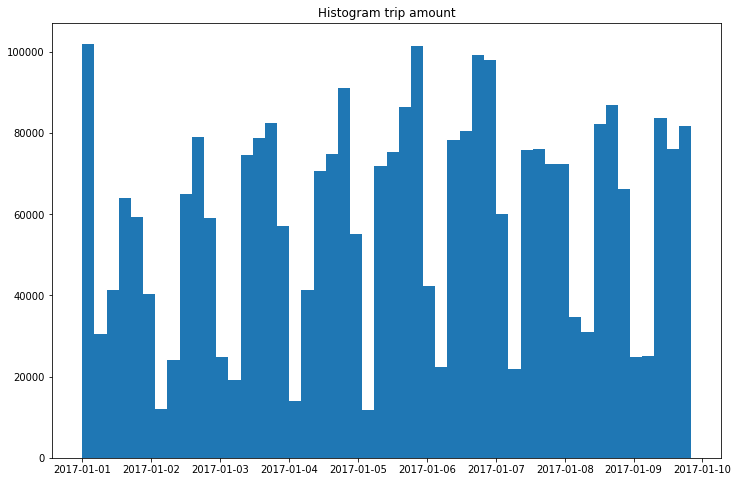

In [ ]:
#The figure clearly shows the spikes in the frequency of peak periods.
pandas_df_2017.hist(column='tpep_pickup_datetime', bins=50, grid=False, figsize=(12,8))
plt.title("Histogram trip amount")

Text(0.5, 1.0, 'Histogram trip amount')

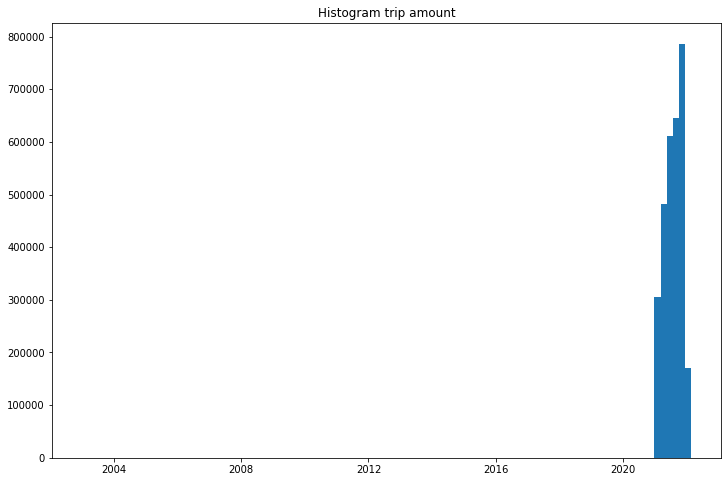

In [32]:
pandas_df_2021.hist(column='tpep_pickup_datetime', bins=100, grid=False, figsize=(12,8))
plt.title("Histogram trip amount")

### Distance and Time Visualization
- The longer the distance between pickup and dropoff locations, the higher the fare.
- Some trips, like to/from an airport are fixed fee.
- Fare at night is different from the day time.

Text(0.5, 1.0, 'Histogram ride distance in miles')

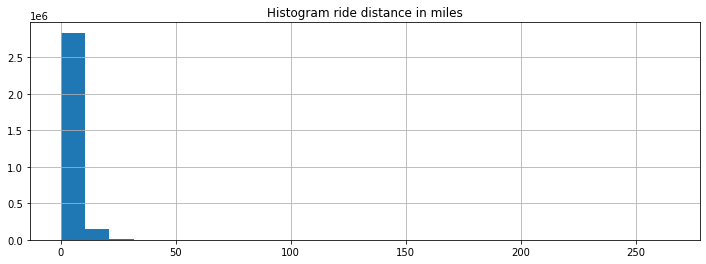

In [ ]:
# Histogram of Distance - 2017

pandas_df_2017.hist(column='trip_distance', bins=25, figsize=(12,4))
plt.title("Histogram ride distance in miles")

Text(0.5, 1.0, 'Histogram ride distance in miles')

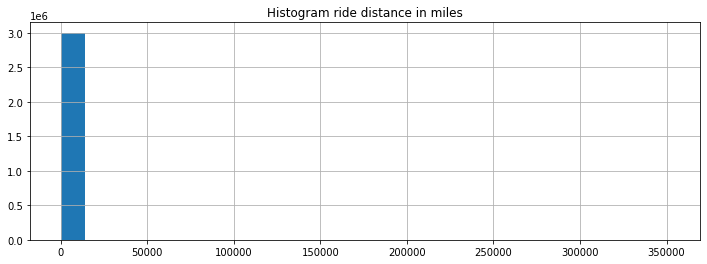

In [33]:
# Histogram of Distance - 2021

pandas_df_2021.hist(column='trip_distance', bins=25, figsize=(12,4))
plt.title("Histogram ride distance in miles")

In [ ]:
# It seems most rides are just short rides

pandas_df_2017.groupby('passenger_count')['trip_distance','fare_amount'].mean()

,trip_distance,fare_amount
passenger_count,,
0,0.380559,27.154615
1,2.839322,12.303112
2,3.092950,12.868998
3,3.034735,12.748273
4,3.131449,13.082924
5,3.007414,12.360948
6,2.923819,12.116348
7,3.250000,47.257143
8,0.000000,8.171429


In [35]:
pandas_df_2021.groupby('passenger_count')['trip_distance','fare_amount'].mean()

,trip_distance,fare_amount
passenger_count,,
0.0,59.895246,21.184768
1.0,2.983885,12.642836
2.0,3.370277,13.774237
3.0,3.254812,13.616651
4.0,3.405394,14.286010
5.0,3.064884,12.671175
6.0,3.094750,12.753716
7.0,3.585000,66.260000
8.0,0.140000,19.150000


#### Scatter Plot distance and Tip

Text(0.5, 1.0, 'All Data')

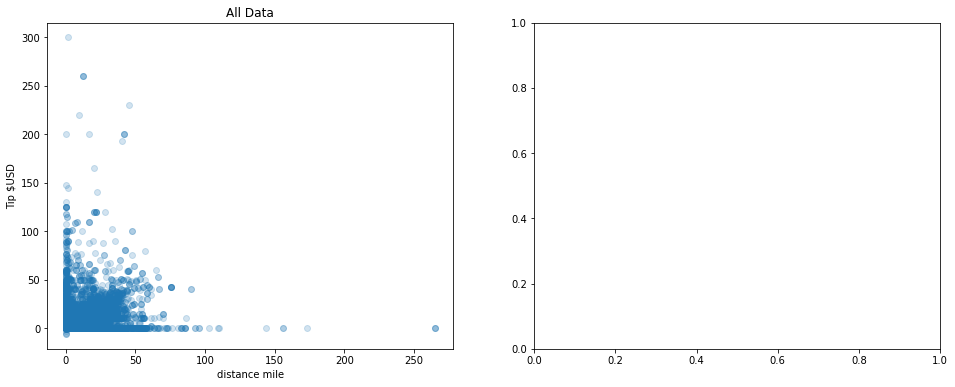

In [ ]:
#Tip amount concentrate between 0 and 50 dollar, and 0 and 50 miles
fig, axs = plt.subplots(1, 2, figsize=(16,6))
axs[0].scatter(pandas_df_2017["trip_distance"], pandas_df_2017["tip_amount"], alpha=0.2)
axs[0].set_xlabel("distance mile")
axs[0].set_ylabel("Tip $USD")
axs[0].set_title("All Data")

In [ ]:
# Zoom-in some part of the data
idx = ((pandas_df_2017['trip_distance'] < 15) & (pandas_df_2017["fare_amount"] < 100))
axs[1].scatter(pandas_df_2017[idx]["trip_distance"], pandas_df_2017[idx]["fare_amount"], alpha=0.2)
axs[1].set_xlabel("distance mile")
axs[1].set_ylabel("Fare $USD")
axs[1].set_title("Zoom in on distance < 15 mile and fare < $100")

Text(0.5, 1.0, 'Zoom in on distance < 15 mile and fare < $100')

Text(0.5, 1.0, 'All Data')

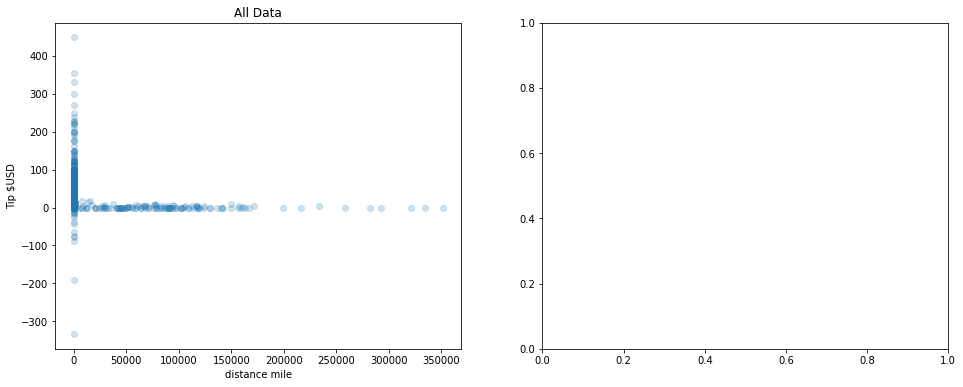

In [53]:
fig, axs = plt.subplots(1, 2, figsize=(16,6))
axs[0].scatter(pandas_df_2021["trip_distance"], pandas_df_2021["tip_amount"], alpha=0.2)
axs[0].set_xlabel("distance mile")
axs[0].set_ylabel("Tip $USD")
axs[0].set_title("All Data")

In [ ]:
# Zoom-in some part of the data
idx = ((pandas_df_2021['trip_distance'] < 15) & (pandas_df_2021["fare_amount"] < 100))
axs[1].scatter(pandas_df_2021[idx]["trip_distance"], pandas_df_2021[idx]["fare_amount"], alpha=0.2)
axs[1].set_xlabel("distance mile")
axs[1].set_ylabel("Fare $USD")
axs[1].set_title("Zoom in on distance < 15 mile and fare < $100")

### Visualize tipping behavior

#### Tips percent by different times of the weak

In [ ]:
# 2017
# filter payment type cash, since tips are not recorded in cash payment
tip = pandas_df_2017[pandas_df_2017['payment_type'] != 2]

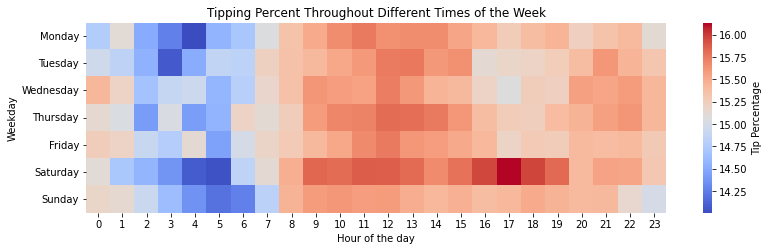

In [ ]:
# compute the tipping percentage in each hour through the week
# Higher tip percentage during the day than at night
import seaborn as sns

cats = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

tip_percent = tip.groupby(['weekday', 'time'], as_index=False)['tip_percent'].mean()
tip_percent.weekday = pd.Categorical(tip_percent.weekday, categories=cats)
tip_percent = tip_percent.sort_values(['weekday', 'time']).reset_index(drop=True)
tip_percent_heatmap = pd.pivot_table(tip_percent, values='tip_percent', index='weekday', columns='time')

fig, ax = plt.subplots(figsize=(13, 3.5))
sns.heatmap(tip_percent_heatmap, cbar_kws={'label': 'Tip Percentage'}, ax=ax, cmap='coolwarm')
ax.set_ylabel('Weekday')
ax.set_xlabel('Hour of the day')
ax.set_title('Tipping Percent Throughout Different Times of the Week')
plt.show()

In [36]:
# 2021
# filter payment type cash, since tips are not recorded in cash payment
tip = pandas_df_2021[pandas_df_2021['payment_type'] != 2]

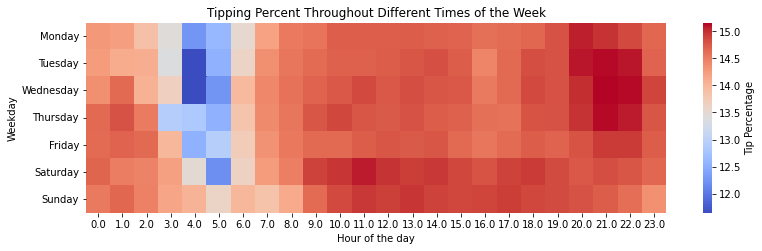

In [40]:
tip_percent = tip.groupby(['weekday', 'time'], as_index=False)['tip_percent'].mean()
tip_percent.weekday = pd.Categorical(tip_percent.weekday, categories=cats)
tip_percent = tip_percent.sort_values(['weekday', 'time']).reset_index(drop=True)
tip_percent_heatmap = pd.pivot_table(tip_percent, values='tip_percent', index='weekday', columns='time')

fig, ax = plt.subplots(figsize=(13, 3.5))
sns.heatmap(tip_percent_heatmap, cbar_kws={'label': 'Tip Percentage'}, ax=ax, cmap='coolwarm')
ax.set_ylabel('Weekday')
ax.set_xlabel('Hour of the day')
ax.set_title('Tipping Percent Throughout Different Times of the Week')
plt.show()

#### Tips by passanger count

In [ ]:
# 2017

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(pandas_df_2017['passenger_count'], pandas_df_2017['tip_amount'])
ax.set_xlabel('Number of passangers')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

In [ ]:
# 2021

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(pandas_df_2021['passanger_count'], pandas_df_2021['tip_amount'])
ax.set_xlabel('Number of passangers')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

#### Avg tips per zone

In [52]:
#2017 PU zone

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(pandas_df_2017['PULocationID'], pandas_df_2017['tip_amount'])
ax.set_xlabel('PU Zones')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7ff5baa2be50> (for post_execute):


KeyboardInterrupt: ignored

Error in callback <function flush_figures at 0x7ff5ba9d9a60> (for post_execute):



KeyboardInterrupt



In [ ]:
#2017 DO zone

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(pandas_df_2017['DOLocationID'], pandas_df_2017['tip_amount'])
ax.set_xlabel('DO Zones')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

In [ ]:
#2021 PU zone

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(pandas_df_2021['PULocationID'], pandas_df_2021['tip_amount'])
ax.set_xlabel('PU Zones')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

In [ ]:
#2021 DO zone

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(pandas_df_2021['DOLocationID'], pandas_df_2021['tip_amount'])
ax.set_xlabel('DO Zones')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

### Correlation

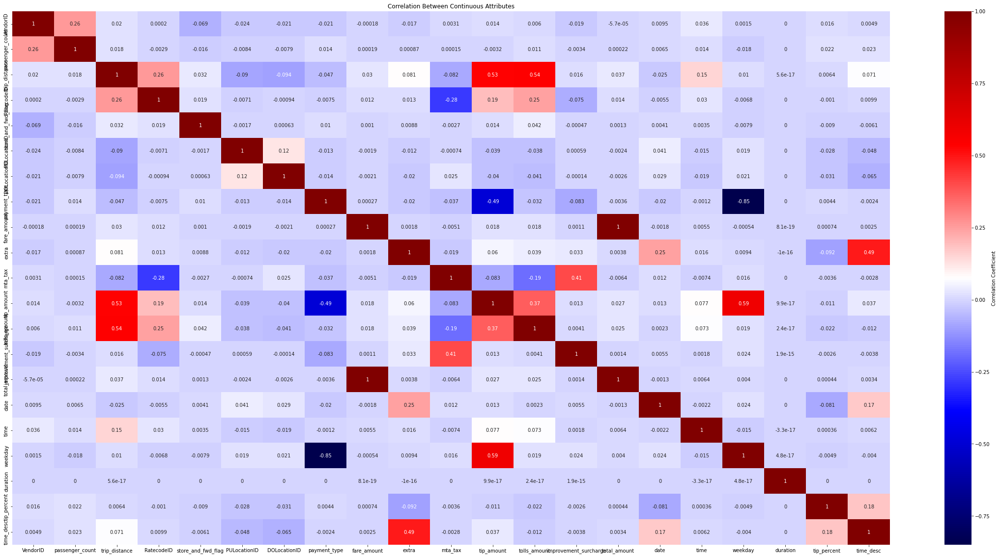

In [ ]:
# 2017
from matplotlib import pyplot as plt
import seaborn as sns

colsNotToInclude = ['airport_fee','tpep_pickup_datetime','tpep_dropoff_datetime','congestion_surcharge','speed']
cols = [col for col in df_2017.columns if col not in colsNotToInclude]

# plot correlation plot
fig, ax = plt.subplots(figsize=(40, 20))
corr_matrix = df_2017[cols].corr()
sns.heatmap(corr_matrix, cmap="seismic", annot=True, ax=ax, cbar_kws={'label': 'Correlation Coefficient'})
ax.set_xticklabels(cols)
ax.set_yticklabels(cols)
ax.set_title("Correlation Between Continuous Attributes")
plt.show()

/usr/local/lib/python3.8/dist-packages/dask/dataframe/core.py:6568: RuntimeWarning: invalid value encountered in subtract
  np.subtract(df.iloc[:, idx].values[:, None], mu[idx][None, :]) ** 2
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_base.py:380: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(
/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:9524: RuntimeWarning: Degrees of freedom <= 0 for slice
  base_cov = np.cov(mat.T, ddof=ddof)
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_base.py:2542: RuntimeWarning: divide by zero encountered in true_divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_base.py:2542: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.8/dist-packages/numpy/lib/function_b

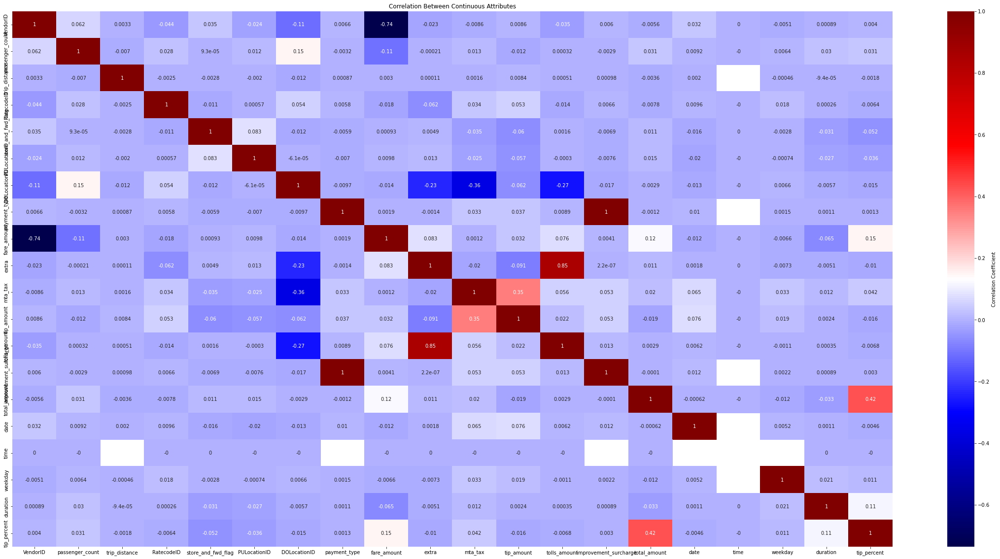

In [ ]:
# 2021
from matplotlib import pyplot as plt
import seaborn as sns

colsNotToInclude = ['airport_fee','tpep_pickup_datetime','tpep_dropoff_datetime','congestion_surcharge','speed']
cols = [col for col in df_2021.columns if col not in colsNotToInclude]

# plot correlation plot
fig, ax = plt.subplots(figsize=(40, 20))
corr_matrix = df_2021[cols].corr()
sns.heatmap(corr_matrix, cmap="seismic", annot=True, ax=ax, cbar_kws={'label': 'Correlation Coefficient'})
ax.set_xticklabels(cols)
ax.set_yticklabels(cols)
ax.set_title("Correlation Between Continuous Attributes")
plt.show()

# Big Data Visualization

The aim of the visualization is to obtain an interactive heatmap that can be used to extract information from the location based distribution of the data. In this project, we are examining tipping, so we have created a heatmap that shows the average tipping rates by location. We made several versions, to get to the desired output. To present a very detailed map of the location points with datashader, we used the dataset for this section from here:
https://s3.amazonaws.com/datashader-data/nyc_taxi_wide.parq

In [1]:
#READING THE DATA

import pandas as pd
import dask.dataframe as dd

# Specify the names of the columns to include in the DataFrame
usecols = ['dropoff_x','dropoff_y','pickup_x','pickup_y','dropoff_hour','pickup_hour','passenger_count', 'tip_amount']

# Read the data from the "nyc_taxi_wide.parq" file into a Dask DataFrame
# This contained location datas before Covid
df = dd.read_parquet('nyc_taxi_wide.parq')[usecols].persist()
df.head()

,dropoff_x,dropoff_y,pickup_x,pickup_y,dropoff_hour,pickup_hour,passenger_count,tip_amount
0,-8234835.5,4975627.0,-8236963.0,4975552.5,19,19,1,3.25
1,-8237020.5,4976875.0,-8237826.0,4971752.5,20,20,1,2.00
2,-8232279.0,4986477.0,-8233561.5,4983296.5,20,20,1,0.00
3,-8238124.0,4971127.0,-8238654.0,4970221.0,20,20,1,0.00
4,-8238107.5,4974457.0,-8234433.5,4977363.0,20,20,1,0.00


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
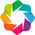

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [dropoff_x,dropoff_y]   (pickup_x,pickup_y,dropoff_hour,pickup_hour,passenger_count,tip_amount)

In [2]:
#EARLY TEST OF THE VISUALIZATION OF THE DATA WITH PLOT

import holoviews as hv
from holoviews.element.tiles import StamenTerrain
hv.extension('bokeh')

# Define the x and y ranges for the map and sample a small fraction of rows
x_range, y_range =(-8242000,-8210000), (4965000,4990000)
samples = df.sample(frac=1e-4)

# Create a StamenTerrain object and a Points object, and combine them
tiles = StamenTerrain().redim.range(x=x_range, y=y_range)
points = hv.Points(samples, ['dropoff_x', 'dropoff_y'])
tiles * hv.Points(df.sample(frac=1e-2), ['dropoff_x', 'dropoff_y'])

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
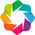

:DynamicMap   []
   :RGB   [dropoff_x,dropoff_y]   (R,G,B,A)

In [3]:
#CREATING A HEATMAP BASED ON DROPOFF LOCATIONS

import datashader as ds
import holoviews.operation.datashader as hd
from datashader.colors import Hot
from holoviews import opts
from holoviews.element.tiles import EsriImagery
hv.extension('bokeh')

# Convert the Points object from the DataFrame into a shaded raster image
shaded = hd.datashade(hv.Points(df, ['dropoff_x', 'dropoff_y']), cmap=Hot, aggregator=ds.count('tip_amount'))

# With the dynspread function adjust the shaded image, and set the visual options for it
hd.dynspread(shaded, threshold=0.5, max_px=4).opts(bgcolor='black', xaxis=None, yaxis=None, width=900, height=500)

In [4]:
#REMOVE OUTLIERS FROM THE TIP AMOUNT COLUMN - PREPARING FOR DRAWING A MAP BASED ON TIP AMOUNT AVERAGES
#

from numpy import mean
from numpy import std

# Dask requirement to process data
data = df['tip_amount'].compute()

# Calculate summary statistics (mean and standard deviation) for the "tip_amount" column
data_mean, data_std = mean(data), std(data)
print(mean(data))
print(std(data))

# Calculate the lower and upper cutoffs for identifying outliers
cut_off = data_std * 1.5
lower, upper = data_mean - cut_off, data_mean + cut_off
print(lower)
print(upper)

# Identify the outliers in the "tip_amount" column, based on the cutoffs
outliers = [x for x in data if x < lower or x > upper]
print('Identified outliers: %d' % len(outliers))
print(outliers)

# Filter the DataFrame to exclude values in the "tip_amount" column that are greater than the upper cutoff
df = df[(df['tip_amount'] < upper)]

1.7074654
1148.0157470703125
-1720.3161551952362
1723.7310860157013
Identified outliers: 1
[3950588.75]


In [5]:
#VISUALIZATION OF THE AVERAGE TIP AMOUNT

import colorcet as cc
from holoviews.operation.datashader import rasterize

# Create a Points object from a DataFrame, using the dropoff_x and dropoff_y columns
points = hv.Points(df, ['dropoff_x', 'dropoff_y'])
map_tiles = EsriImagery().opts(alpha=0.5, width=900, height=480, bgcolor='black')
# Define a dictionary of options for the rasterize function (use the "bmy" color map, and color bar at the bottom)
ropts = dict(tools=['hover'], colorbar=True, colorbar_position='bottom', cmap=cc.bmy, cnorm='eq_hist', xlabel ='Latitude', ylabel='Longitude', clabel='Average Tip Amount')
# Use the rasterize function, and set the options for it
taxi_trips = rasterize(points, aggregator=ds.mean('tip_amount')).opts(**ropts)
# Combine the Raster object with the Points object
map_tiles * taxi_trips

:DynamicMap   []
   :Overlay
      .Tiles.I :Tiles   [x,y]
      .Image.I :Image   [dropoff_x,dropoff_y]   (dropoff_x_dropoff_y tip_amount)

#Modelling - feature importances - year 2017

In both years, two models were finally chosen: linear regression and random forest. We also tried the ensemble learner and some models of dask_ml, but we could not get anything meaningful out of them.

In [ ]:
#Load security saving of standardized data if it is neccesary
df_2017_for_modelling = dd.read_parquet("/content/drive/MyDrive/BigData/2017_ALL3_scaled_values.parquet", engine = "pyarrow")
df_2017_target = dd.read_parquet("/content/drive/MyDrive/BigData/2017_TARGET_scaled_values.parquet", engine = "pyarrow")

In [ ]:
colsNotToInclude = ['tip_percent','speed','total_amount','fare_amount']
features = [col for col in df_2017_for_modelling.columns if col not in colsNotToInclude]
df_2017_for_modelling = df_2017_for_modelling[features]

In [ ]:
df_2017_for_modelling = df_2017_for_modelling.fillna(0)

In [ ]:
df_2017_for_modelling = df_2017_for_modelling.replace(np.inf, 0)

In [ ]:
!pip install dask_ml

In [ ]:
# building our model
import dask_ml
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from dask_ml.ensemble import BlockwiseVotingRegressor


linreg = LinearRegression()
knn = KNeighborsRegressor(n_neighbors=5)
forest = RandomForestRegressor(n_estimators=100, random_state=42)

In [ ]:
from dask.distributed import Client
client = Client()

In [ ]:
from joblib import parallel_backend
with parallel_backend('dask'):
  linreg.fit(df_2017_for_modelling, df_2017_target)

In [ ]:
df_2017_for_modelling.dtypes

VendorID                 float64
passenger_count          float64
trip_distance            float64
RatecodeID               float64
store_and_fwd_flag       float64
PULocationID             float64
DOLocationID             float64
payment_type             float64
extra                    float64
mta_tax                  float64
tolls_amount             float64
improvement_surcharge    float64
time                     float64
duration                 float64
speed_category           float64
season_num               float64
weekday_num              float64
time_desc_num            float64
dtype: object

In [ ]:
importance = linreg.coef_[0]

# summarize feature importance
for i,v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: -0.01857
Feature: 1, Score: -0.00690
Feature: 2, Score: 1.05628
Feature: 3, Score: 0.14281
Feature: 4, Score: -0.00853
Feature: 5, Score: -0.01436
Feature: 6, Score: 0.00783
Feature: 7, Score: -1.22204
Feature: 8, Score: -0.02127
Feature: 9, Score: -0.08150
Feature: 10, Score: 0.12098
Feature: 11, Score: -0.04406
Feature: 12, Score: 0.00934
Feature: 13, Score: -0.01126
Feature: 14, Score: 0.00736
Feature: 15, Score: -0.00000
Feature: 16, Score: -0.00211
Feature: 17, Score: 0.05439


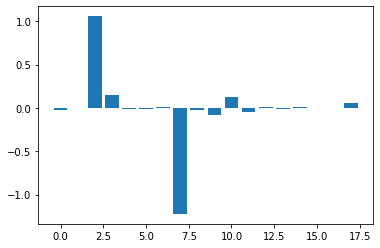

In [ ]:
from matplotlib import pyplot

pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [ ]:
with parallel_backend('dask'):
  forest.fit(df_2017_for_modelling, df_2017_target)

<ipython-input-26-ddaa0bbfebc4>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest.fit(df_2017_for_modelling, df_2017_target)


In [ ]:
with parallel_backend('dask'):
  print(forest.score(df_2017_for_modelling, df_2017_target))

0.9999654890804661


In [ ]:
# summarize feature importance
for i,v in enumerate(forest.feature_importances_):
 print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: 0.00709
Feature: 1, Score: 0.01518
Feature: 2, Score: 0.39907
Feature: 3, Score: 0.02817
Feature: 4, Score: 0.00030
Feature: 5, Score: 0.04750
Feature: 6, Score: 0.05034
Feature: 7, Score: 0.25945
Feature: 8, Score: 0.00383
Feature: 9, Score: 0.00207
Feature: 10, Score: 0.01402
Feature: 11, Score: 0.00029
Feature: 12, Score: 0.04341
Feature: 13, Score: 0.11460
Feature: 14, Score: 0.00016
Feature: 15, Score: 0.00001
Feature: 16, Score: 0.00634
Feature: 17, Score: 0.00818


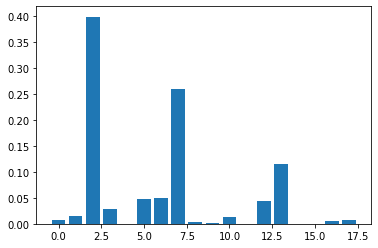

In [ ]:
pyplot.bar([x for x in range(len(forest.feature_importances_))], abs(forest.feature_importances_))
pyplot.show()

In [ ]:
with parallel_backend('dask'):
  voting = VotingRegressor([('LinReg', linreg), ('KNN', knn), ('RandomForest', forest)])
  voting.fit(df_2017_for_modelling, df_2017_target)

/usr/local/lib/python3.8/dist-packages/sklearn/ensemble/_voting.py:528: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


#Modelling - feature importances - year 2021

In [ ]:
#Load security saving of standardized data if it is neccesary
df_2021_for_modelling = dd.read_parquet("/content/drive/MyDrive/BigData/2021_ALL3_scaled_values.parquet", engine = "pyarrow")
df_2021_target = dd.read_parquet("/content/drive/MyDrive/BigData/2021_TARGET_scaled_values.parquet", engine = "pyarrow")

In [ ]:
colsNotToInclude = ['tip_percent','speed','total_amount','fare_amount']
features = [col for col in df_2021_for_modelling.columns if col not in colsNotToInclude]
df_2021_for_modelling = df_2021_for_modelling[features]

In [ ]:
df_2021_for_modelling = df_2021_for_modelling.fillna(0)

In [ ]:
df_2021_for_modelling = df_2021_for_modelling.replace(np.inf, 0)

In [ ]:
!pip install dask_ml

In [ ]:
# building our model
import dask_ml
import joblib
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from dask_ml.ensemble import BlockwiseVotingRegressor


linreg = LinearRegression()
knn = KNeighborsRegressor(n_neighbors=5)
forest = RandomForestRegressor(n_estimators=30, random_state=42)

In [ ]:
from dask.distributed import Client
client = Client()

In [ ]:
from joblib import parallel_backend
with parallel_backend('dask'):
  linreg.fit(df_2021_for_modelling, df_2021_target)

In [ ]:
from joblib import parallel_backend
with parallel_backend('dask'):
  print(linreg.score(df_2021_for_modelling, df_2021_target))

0.43317938761439534


In [ ]:
importance = linreg.coef_[0]

# summarize feature importance
for i,v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: 0.28228
Feature: 1, Score: 0.00052
Feature: 2, Score: 158.77730
Feature: 3, Score: 0.00564
Feature: 4, Score: -0.00555
Feature: 5, Score: -0.01613
Feature: 6, Score: -0.01239
Feature: 7, Score: -1.43001
Feature: 8, Score: 0.27224
Feature: 9, Score: -0.36848
Feature: 10, Score: 0.47730
Feature: 11, Score: 0.05211
Feature: 12, Score: 0.01674
Feature: 13, Score: 0.03260
Feature: 14, Score: 0.01174
Feature: 15, Score: 0.08520
Feature: 16, Score: 0.00837
Feature: 17, Score: -0.04326


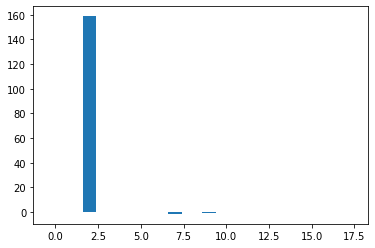

In [ ]:
from matplotlib import pyplot

pyplot.bar([x for x in range(len(importance))], importance)
pyplot.show()

In [ ]:
with parallel_backend('dask'):
  forest.fit(df_2021_for_modelling, df_2021_target)

<ipython-input-11-425c19d64493>:2: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  forest.fit(df_2021_for_modelling, df_2021_target)


In [ ]:
# summarize feature importance
for i,v in enumerate(forest.feature_importances_):
 print('Feature: %0d, Score: %.5f' % (i,v))

Feature: 0, Score: 0.00545
Feature: 1, Score: 0.01853
Feature: 2, Score: 0.37971
Feature: 3, Score: 0.04339
Feature: 4, Score: 0.00098
Feature: 5, Score: 0.05143
Feature: 6, Score: 0.05247
Feature: 7, Score: 0.21799
Feature: 8, Score: 0.01318
Feature: 9, Score: 0.00200
Feature: 10, Score: 0.01195
Feature: 11, Score: 0.00065
Feature: 12, Score: 0.04101
Feature: 13, Score: 0.10009
Feature: 14, Score: 0.00006
Feature: 15, Score: 0.01663
Feature: 16, Score: 0.03253
Feature: 17, Score: 0.01196


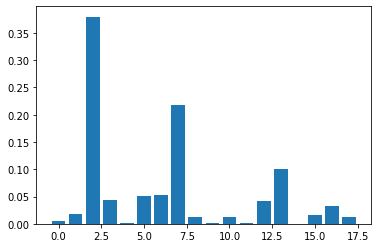

In [ ]:
from matplotlib import pyplot

pyplot.bar([x for x in range(len(forest.feature_importances_))], forest.feature_importances_)
pyplot.show()